# Test inference script

In [2]:
import cv2
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Rectangle
import numpy as np
import sahi
from sahi.predict import ObjectPrediction, get_sliced_prediction
from sahi.prediction import PredictionResult
from sahi.utils.cv import visualize_object_predictions
from sahi.utils.file import Path
import time
import torch

import models


In [3]:
%matplotlib inline


In [4]:
def image_torch_to_np(image: torch.Tensor) -> np.ndarray:
    return image.permute(1, 2, 0).numpy()

#### Code qui reprant pour tester une image du dataset de test

In [6]:
model = models.get_fasterrcnn_mobilenet_v3(
    weights_path="../pretrained-models/fasterrcnn-scale1-bs32-epochs100-weights.pth"
)

INFO-20231020-15:06:45|FasterRCNN loaded with ../pretrained-models/fasterrcnn-scale1-bs32-epochs100-weights.pth


In [7]:
detection_model = models.PinesDetectionModel(
    model=model,
    confidence_threshold=0.5,
    device="cuda:0",
    load_at_init=True
)

In [15]:
from app import get_result
im0_path = "/mnt/sda1/1-Pins/Images_tests_for_app/stsardos_2021_17_9.jpg"
result0 = get_result(im0_path, detection_model)
img = cv2.cvtColor(cv2.imread(im0_path), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(50, 30), dpi=80)

plt.rcParams['figure.figsize'] = (50, 30)
plt.rcParams['figure.dpi'] = 80


Performing prediction on 704 number of slices.


<Figure size 4000x2400 with 0 Axes>

In [ ]:
def is_box_in_circle(image_shape, x1, y1, x2, y2, radius):
    h, w = image_shape[
           :2]  # Assuming the image shape is (height, width) or (height, width, channels)
    x_center, y_center = w // 2, h // 2  # Integer division to get the center

    # Coordinates for the four corners of the box
    corners = [(x1, y1), (x1, y2), (x2, y1), (x2, y2)]

    for x, y in corners:
        if (x - x_center) ** 2 + (y - y_center) ** 2 <= radius ** 2:
            return True  # At least one corner is inside the circle

    return False  # No corner is inside the circle


21


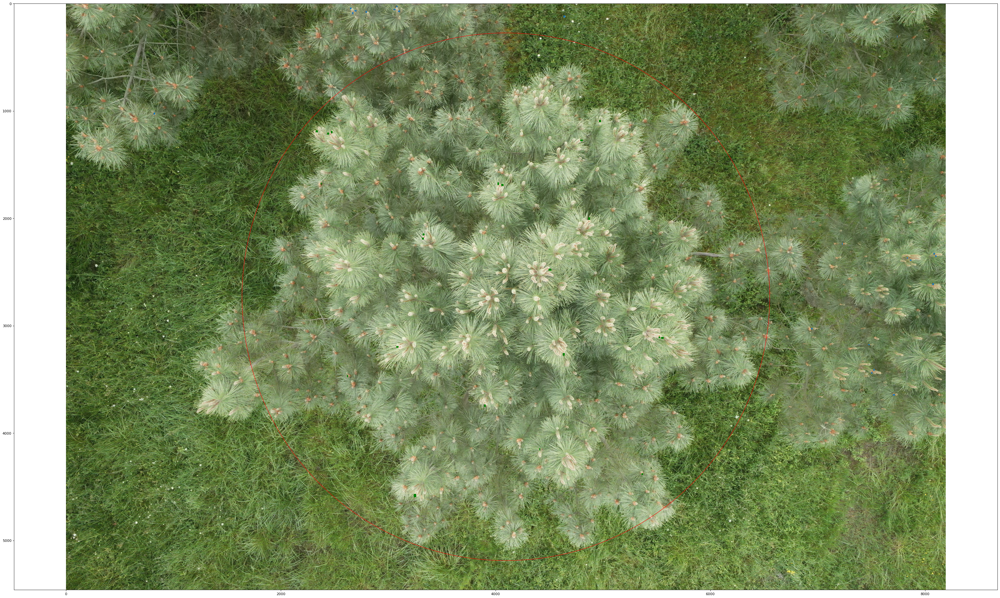

In [18]:
radius_percentage = 0.9
h, w, _ = img.shape
circle_center = (w / 2, h / 2)
radius = (min(h, w) * radius_percentage) / 2
_, ax = plt.subplots()
ax.set_aspect('equal', adjustable='datalim')

ax.imshow(img)

circle_center = (img.shape[1]/2, img.shape[0]/2)
circle = Circle(circle_center, radius, fill=False, color='red')
ax.add_patch(circle)

nb_object_in_circle = 0
for object_prediction in result0.object_prediction_list:
    object_prediction = object_prediction.deepcopy()
    bbox_wh = [int(b) for b in object_prediction.bbox.to_xywh()]
    bbox_xy = [int(b) for b in object_prediction.bbox.to_xyxy()]
    
    rectangle = Rectangle((bbox_wh[0], bbox_wh[1]), bbox_wh[2], bbox_wh[3])
    # x1 y1 x2 y2
    bbox_corners = [(bbox_xy[0], bbox_xy[1]), (bbox_xy[0], bbox_xy[3]), (bbox_xy[2], bbox_xy[1]), (bbox_xy[2], bbox_xy[3])]
    for x, y in bbox_corners:
        if (x - circle_center[0]) ** 2 + (y - circle_center[1]) ** 2 <= radius ** 2:
            rectangle.set_color('green')
            nb_object_in_circle += 1
            break
    ax.add_patch(rectangle)
print(nb_object_in_circle)
plt.show()

### À tester

(x−x_center​)²+(y−y_center​)² ≤ r²

In [ ]:
# TODO: get box from result

# Sample box coordinates (top-left and bottom-right corners)
x1, y1 = 45, 45
x2, y2 = 55, 55

# Define the radius
radius = 30

# Check if any part of the box is inside the circle
result = is_box_in_circle(image_shape, x1, y1, x2, y2, radius)
print("Does the box intersect the circle?", result)


In [ ]:
for i, im in enumerate(images_paths):
    Image(im)
    result_i = get_result_from_image_path(im)

    result_i.export_visuals(export_dir="demo_data/", file_name=f"im{i}")
    Image(f"demo_data/im{i}.png")
    print(len(result_i.object_prediction_list))


In [ ]:
result.export_visuals(export_dir="demo_data/", file_name="pred_im0")

Image("demo_data/pred_im0.png")

Pour les petites images

In [ ]:
result = get_prediction(image_torch_to_np(image_test_0), detection_model)

Pour les grandes images

In [ ]:
result = sahi.predict.get_sliced_prediction(
    im0_path,
    detection_model,
    slice_height=320,
    slice_width=320,
    overlap_height_ratio=0.2,
    overlap_width_ratio=0.2,
)

In [11]:
result0.export_visuals(
    export_dir="results_tests_images/",
    text_size=1,
    rect_th=2,
    file_name="im1",
    hide_conf=True,
    hide_labels=True
)

INFO-20231018-12:14:06|Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO-20231018-12:14:06|NumExpr defaulting to 8 threads.


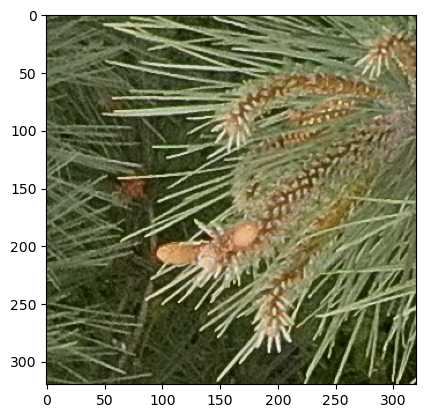

In [7]:
test_set = torch.load("../datasets/stsardos_A_test_dset.pt")
image_test_0 = image_torch_to_np(test_set[0][0])
plt.imshow(image_test_0)
# Pas bon car petite image

In [4]:
def visualize_object_predictions(
        image: np.array,
        object_prediction_list,
        rect_th: int = None,
        text_size: float = None,
        text_th: float = None,
        color: tuple = None,
        hide_text: bool = False,
        hide_conf: bool = False,
        output_dir: str = None,
        file_name: str = "prediction_visual",
        export_format: str = "png",
):
    """
    Visualizes prediction category names, bounding boxes over the source image
    and exports it to output folder.
    Arguments:
        object_prediction_list: a list of prediction.ObjectPrediction
        rect_th: rectangle thickness
        text_size: size of the category name over box
        text_th: text thickness
        color: annotation color in the form: (0, 255, 0)
        hide_labels: hide labels
        hide_conf: hide confidence
        output_dir: directory for resulting visualization to be exported
        file_name: exported file will be saved as: output_dir+file_name+".png"
        export_format: can be specified as 'jpg' or 'png'
    """
    elapsed_time = time.time()
    # deepcopy image so that original is not altered
    import copy
    image = copy.deepcopy(image)
    # select predefined classwise color palette if not specified
    if color is None:
        from sahi.utils.cv import Colors
        colors = Colors()
    else:
        colors = None
    # set rect_th for boxes
    rect_th = rect_th or max(round(sum(image.shape) / 2 * 0.003), 2)
    # set text_th for category names
    text_th = text_th or max(rect_th - 1, 1)
    # set text_size for category names
    text_size = text_size or rect_th / 3

    # add masks to image if present
    for object_prediction in object_prediction_list:
        # deepcopy object_prediction_list so that original is not altered
        object_prediction = object_prediction.deepcopy()
        # visualize masks if present
        if object_prediction.mask is not None:
            # deepcopy mask so that original is not altered
            mask = object_prediction.mask.bool_mask
            # set color
            if colors is not None:
                color = colors(object_prediction.category.id)
            # draw mask
            rgb_mask = apply_color_mask(mask, color)
            image = cv2.addWeighted(image, 1, rgb_mask, 0.6, 0)

    # add bboxes to image if present
    for object_prediction in object_prediction_list:
        # deepcopy object_prediction_list so that original is not altered
        object_prediction = object_prediction.deepcopy()

        bbox = object_prediction.bbox.to_xyxy()
        category_name = object_prediction.category.name
        score = object_prediction.score.value

        # set color
        if colors is not None:
            color = colors(object_prediction.category.id)
        # set bbox points
        p1, p2 = (int(bbox[0]), int(bbox[1])), (int(bbox[2]), int(bbox[3]))
        # visualize boxes
        cv2.rectangle(
            image,
            p1,
            p2,
            color=color,
            thickness=rect_th,
        )

        # arange bounding box text location
        label = f"{category_name}"

        if not hide_conf:
            label += f" {score:.2f}"

        # w, h = cv2.getTextSize(label, 0, fontScale=text_size, thickness=text_th)[0]  # label width, height
        # outside = p1[1] - h - 3 >= 0  # label fits outside box
        # p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
        # # add bounding box text
        # cv2.rectangle(image, p1, p2, color, -1, cv2.LINE_AA)  # filled

        if not hide_text:
            cv2.putText(
                image,
                label,
                (p1[0], p1[1] - 2 if outside else p1[1] + h + 2),
                0,
                text_size,
                (255, 255, 255),
                thickness=text_th,
            )

    # export if output_dir is present
    if output_dir is not None:
        # export image with predictions
        Path(output_dir).mkdir(parents=True, exist_ok=True)
        # save inference result
        save_path = str(Path(output_dir) / (file_name + "." + export_format))
        cv2.imwrite(save_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

    elapsed_time = time.time() - elapsed_time
    return {"image": image, "elapsed_time": elapsed_time}


In [5]:
def export_visuals(
        self,
        export_dir: str,
        text_size: float = None,
        rect_th: int = None,
        hide_labels: bool = False,
        hide_conf: bool = False,
        file_name: str = "prediction_visual",
):
    Path(export_dir).mkdir(parents=True, exist_ok=True)
    visualize_object_predictions(
        image=np.ascontiguousarray(self.image),
        object_prediction_list=self.object_prediction_list,
        rect_th=rect_th,
        text_size=text_size,
        text_th=None,
        color=None,
        hide_text=hide_labels,
        hide_conf=hide_conf,
        output_dir=export_dir,
        file_name=file_name,
        export_format="png",
    )


PredictionResult.export_visuals = export_visuals
